# Homework 3 

In [66]:
import numpy as np
import matplotlib.pyplot as plt

def plot_one_image(image: np.ndarray, text=None) -> None:
    """
    Отобразить изображение с помощью matplotlib.
    Вспомогательная функция.
    
    :param image: изображение для отображения
    :return: None
    """
    fig, axs = plt.subplots(1, 1, figsize=(8, 7))
    axs.imshow(image)
    axs.axis('off')
    if text:
        axs.text(
            x=image.shape[1] // 2,  # Положение по ширине (по центру)
            y=20,  # Высота надписи
            s=text,  # Сам текст
            fontsize=20,  # Размер шрифта
            color="white",  # Цвет текста
            ha="center",  # Выравнивание по центру
            bbox=dict(facecolor='black', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.5')  # Фон текста
        )
    plt.plot()

# Задача №1 - Лес или пустыня?

Часто при анализе изображений местности необходимо понять ее характер. В частности, если определить, что на изображении преобладет вода, то имеет смысл искать корабли на таком изображении. Если на картинке густой лес, то, возможно, это не лучшая зона для посадки дрона или беспилотника.

Ваша задача - написать программу, которая будет отличать лес от пустыни. В приложении можно найти реальные спутниковые снимки лесов и пустынь.

Примеры изображений:
<table><tr>
    <td> <img src="https://i.ibb.co/nmHHctW/test_image_00.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/dM77C4b/test_image_06.jpg" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [67]:
import cv2

def forest_or_desert(image_path):
    # Загружаем изображение
    image = cv2.imread(image_path)
    
    # Преобразуем изображение в цветовое пространство HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Создаем маску для зеленого цвета (обычно соответствует листве)
    green_low = np.array([35, 40, 40])
    greep_high = np.array([85, 255, 255])
    green_mask = cv2.inRange(hsv_image, green_low, greep_high)

    # Создаем маску для желтого цвета (обычно соответствует песку)
    yellow_low = np.array([15, 40, 40])
    yellow_high = np.array([35, 255, 255])
    yellow_mask = cv2.inRange(hsv_image, yellow_low, yellow_high)

    # Определяем, чего больше на изображении: зеленого или желтого цвета
    if cv2.countNonZero(green_mask) > cv2.countNonZero(yellow_mask):
        return "forest"
    else:
        return "desert"  


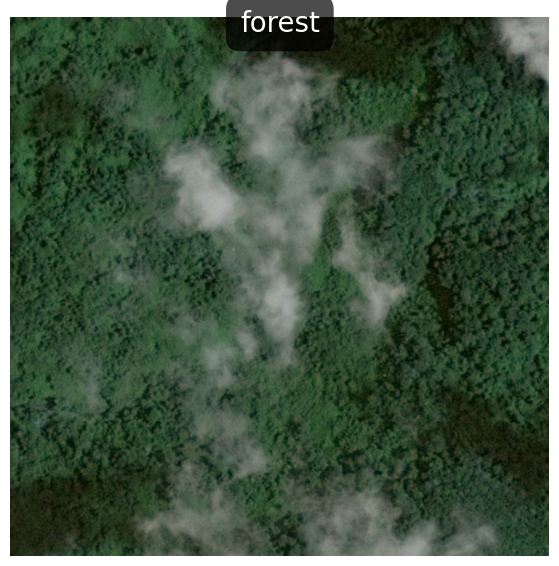

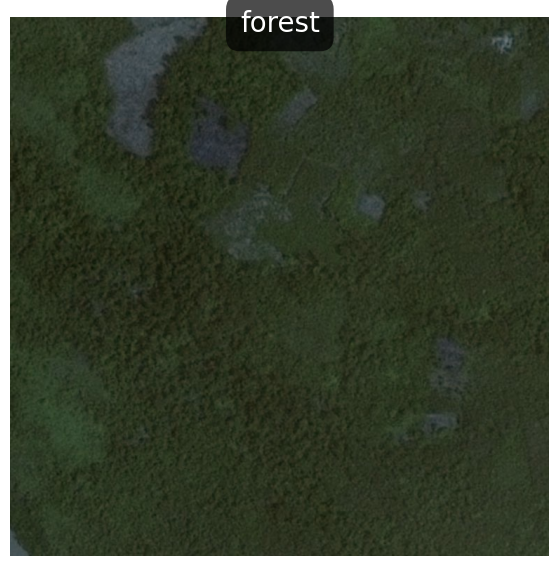

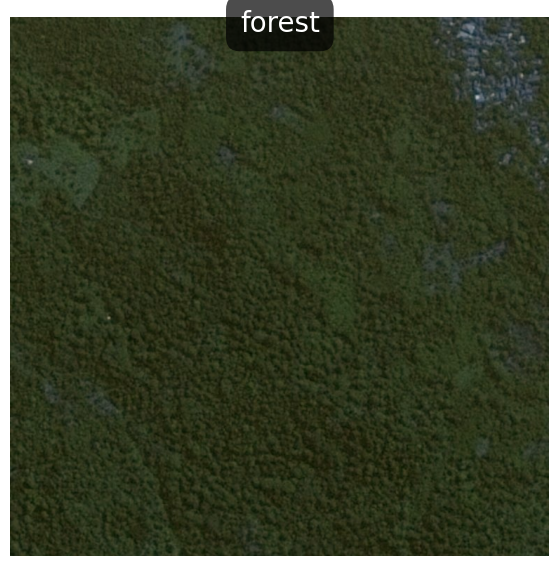

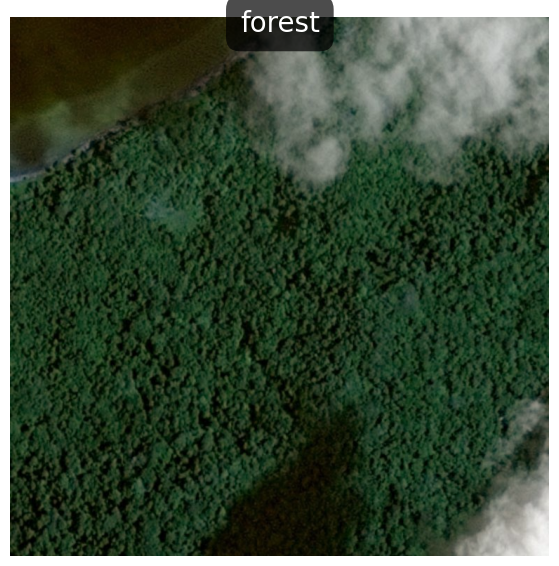

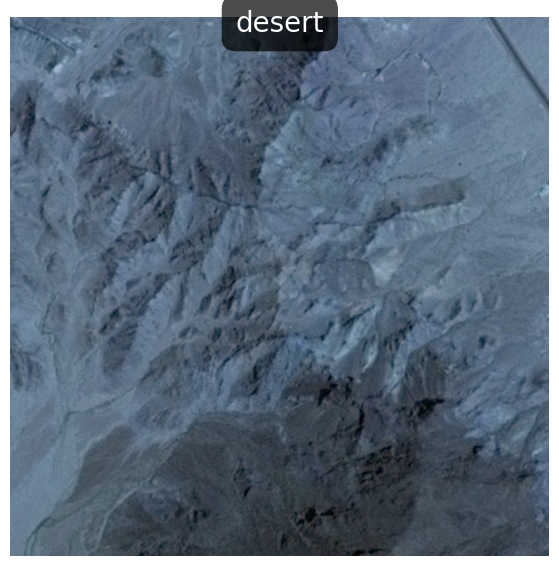

...

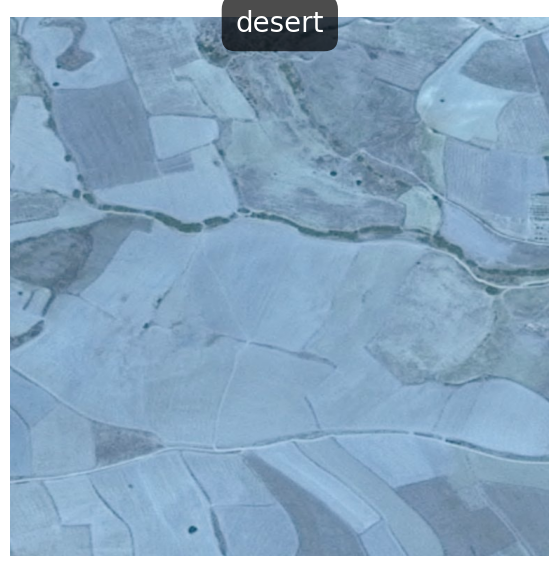

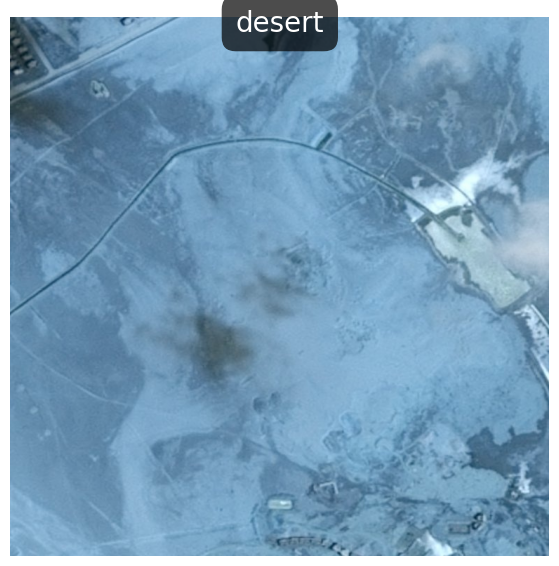

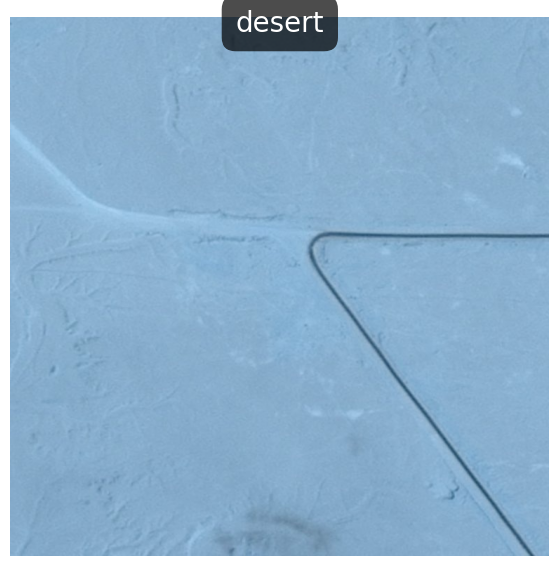

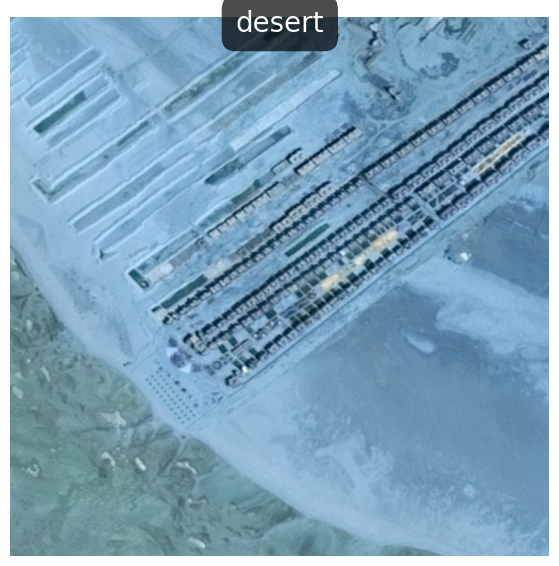

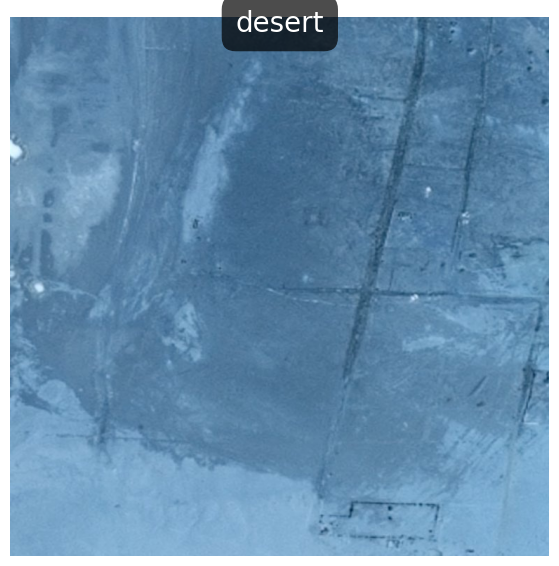

In [68]:
from os import listdir
from os.path import isfile, join

dataset_path = 'desert_forest'

images_path = [join(dataset_path,f) for f in listdir(dataset_path) if isfile(join(dataset_path, f))]


for img_path in images_path:
    img_bin = cv2.imread(img_path)
    obj_text = forest_or_desert(img_path)
    plot_one_image(img_bin, obj_text)


# Задача №2 - Реализовать Image-blending на основе сшивки по градиентам

Задача - взять фото двух лиц : ваше и друга, с помощью метода Poisson image editing совместить глаза, нос и рот с первого изображения со вторым. Суть в том, что при использовании такого метода границы совмещенного изображения не видны.

Статья, где описан метод  

Patrick Pérez, Michel Gangnet, and Andrew Blake. 2003. Poisson image editing. ACM Trans. Graph. 22, 3 (July 2003), 313–318. https://doi.org/10.1145/882262.882269

Пример такого совмещения:

<img src="blending/blending.png" alt="Drawing" style="width: 700px;"/>


In [69]:
face_cascade = cv2.CascadeClassifier('blending/xml/haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('blending/xml/haarcascade_eye.xml')
nose_cascade = cv2.CascadeClassifier('blending/xml/haarcascade_mcs_nose.xml')  
mouth_cascade = cv2.CascadeClassifier('blending/xml/haarcascade_mcs_mouth.xml')

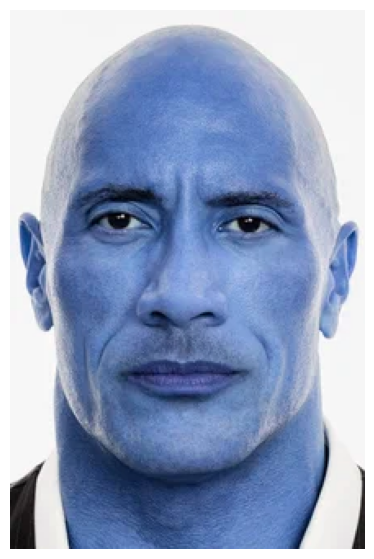

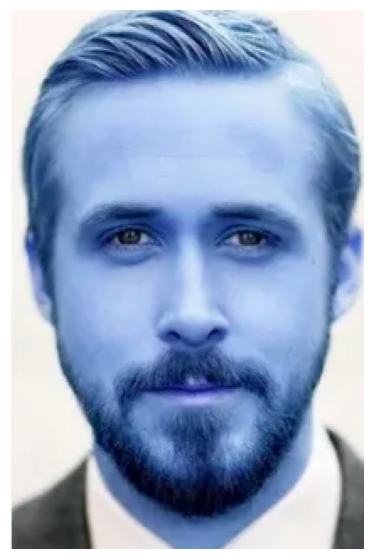

In [70]:
plot_one_image(cv2.imread('blending/man1.jpg'))
plot_one_image(cv2.imread('blending/man2.jpg'))

In [71]:
def find_face_features(img_path):
    """Определяет черты лица (глаза, нос, рот) и создает маску, выделяющую их."""
    
    # Загрузка изображения и преобразование в оттенки серого
    img = cv2.imread(img_path)
    gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Обнаружение лиц на изображении
    faces = face_cascade.detectMultiScale(gray_image, 1.3, 5)
    
    # Если лица не найдены, вернуть оригинальное изображение и пустую маску
    if len(faces) == 0:
        return img, np.zeros_like(gray_image)
    
    # Создание пустой маски такого же размера, как и изображение в градациях серого
    mask = np.zeros_like(gray_image)
    
    # Получение координат первого найденного лица
    x, y, w, h = faces[0]
    face_image = gray_image[y:y+h, x:x+w]
    
    # Обнаружение и выделение черт лица (глаз, носа, рта)
    for cascade in [eye_cascade, nose_cascade, mouth_cascade]:
        features = cascade.detectMultiScale(face_image)
        for (fx, fy, fw, fh) in features:
            # Отрисовка эллипса на маске для выделения найденной черты лица
            cv2.ellipse(mask, ((fx + fw//2 + x), (fy + fh//2 + y)), (fw//2, fh//2), 0, 0, 360, 255, -1)
    
    return img, mask

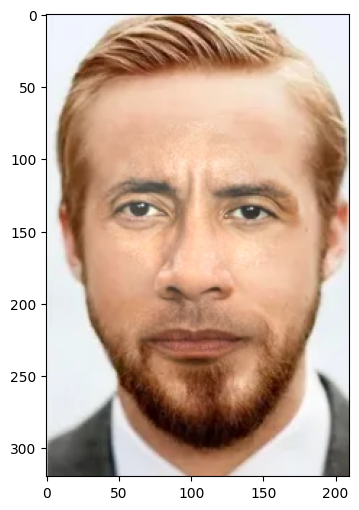

In [72]:
man1_img, man_mask = find_face_features('blending/man1.jpg')
man2_img, woman_mask = find_face_features('blending/man2.jpg')

h, w = man2_img.shape[0], man2_img.shape[1]
man1_resized = cv2.resize(man1_img, (w, h))
man1_mask_resized = cv2.resize(man_mask, (w, h))

seamless_img = cv2.seamlessClone(man1_resized, man2_img, man1_mask_resized, (w // 2, h // 2), cv2.NORMAL_CLONE)

plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(seamless_img, cv2.COLOR_BGR2RGB))
plt.show()

# Задача №3 - Найди клетки

Даны снимки раковых клеток. Существует задача - определить стадию рака клетки по такому изображению. Для того, чтобы подойти к решению классификации рака клетки, необходимо сначала подготовить данные.

Исходные изображения в реальных задачах могут быть очень большого размера (более 20000 px). Однако из визуального анализа можно заметить, что большая часть этих снимков пустая и не несет в себе полезную информацию.

Ваша задача выделить небольшие ячейки изображений из исходного так, чтобы на ячейках было только изображение клетки.

Пример исходного изображения и нарезанных ячеек клетки.
<img src="../img/cell_example.png" alt="Drawing" style="width: 500px;"/>

В качестве аргументов у функции будут значения:
1. исходное изображние;
2. размер ячейки;
3. количество ячеек.

__Доп вопрос__ - как можно выяснить какие нужны значения аргументов, чтобы они подходили для большинства исходных снимков?

In [73]:
from PIL import Image

def extract_and_display_cells(image_path, cell_size, cell_cnt):
    """
    Извлекает ячейки из изображения, фильтруя их по яркости.
    
    Аргументы:
        image_path (str): Путь к изображению.
        cell_size (int): Размер одной ячейки.
        cell_cnt (int): Количество ячеек для выбора.
    
    Возвращает:
        list: Список отфильтрованных ячеек.
    """
    
    # Загружаем изображение и преобразуем в массив numpy
    img = np.array(Image.open(image_path))
    h, w = img.shape[:2]  # Получаем размеры изображения
    cells = []  # Список для хранения выбранных ячеек
    
    # Проход по изображению с заданным шагом
    for y in range(0, h, cell_size):
        for x in range(0, w, cell_size):
            if len(cells) >= cell_cnt:
                break  # Если набрали нужное количество ячеек, выходим
            
            # Вырезаем ячейку из изображения
            cell = img[y:y + cell_size, x:x + cell_size]
            
            # Фильтруем ячейки по среднему значению яркости
            if cell.mean() < 240:
                cells.append(cell)
    
    return cells

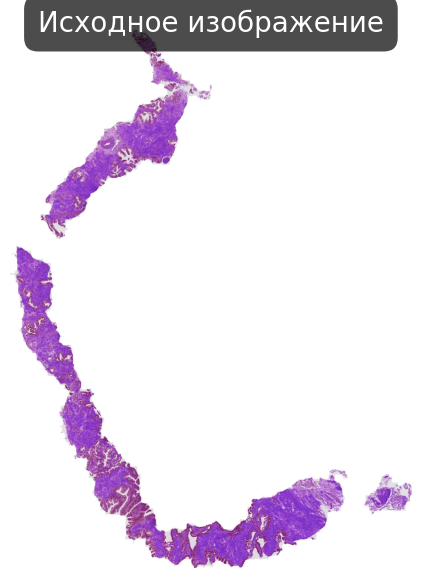

In [74]:
plot_one_image(cv2.imread('cells/train0_1.jpeg'), 'Исходное изображение')

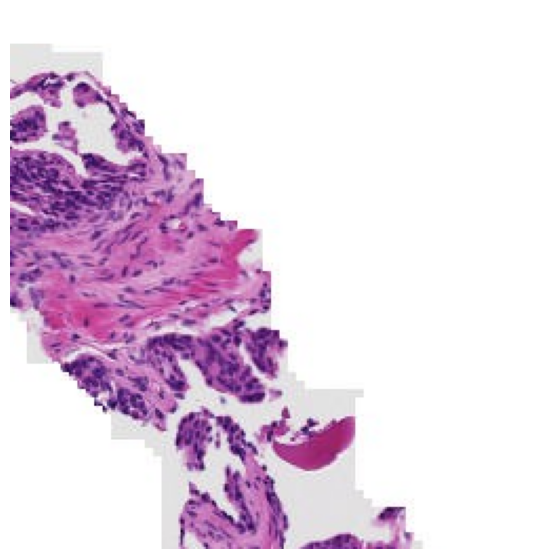

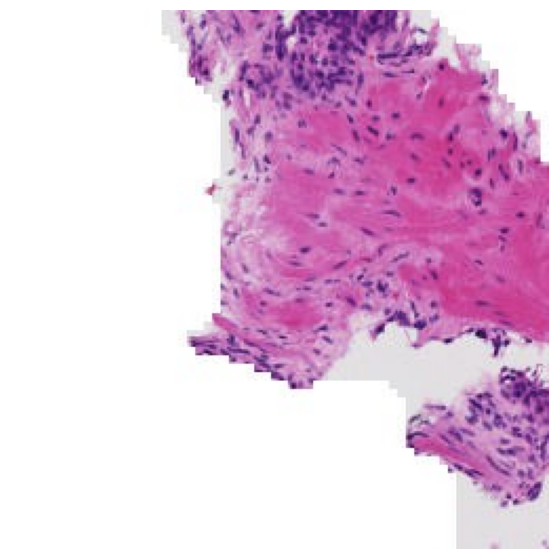

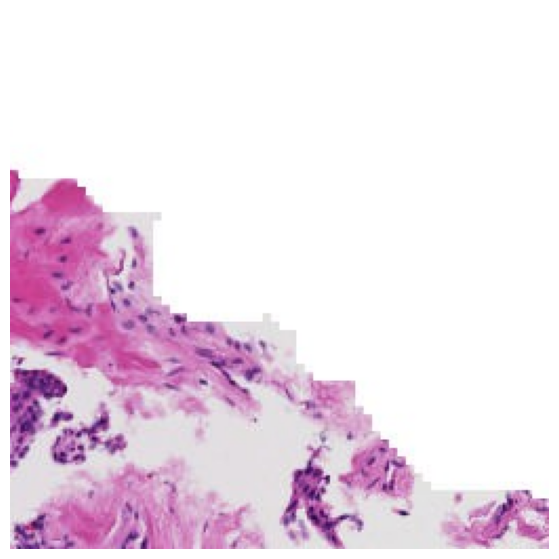

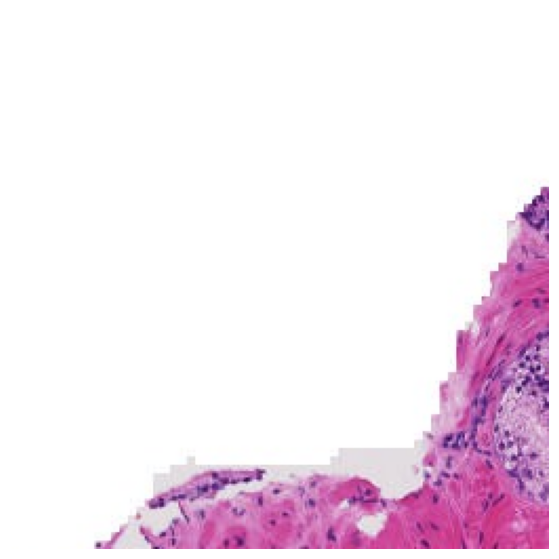

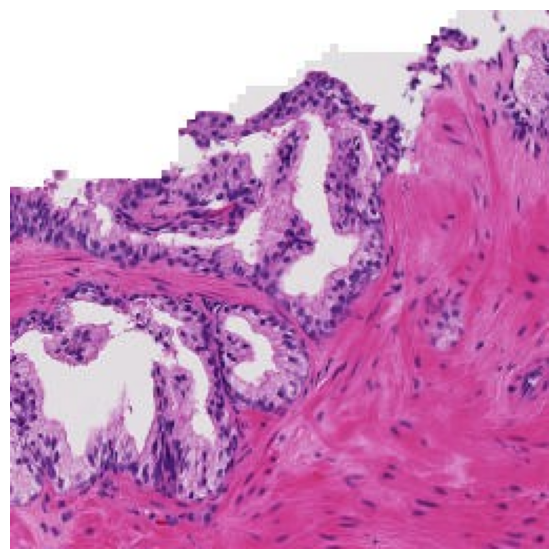

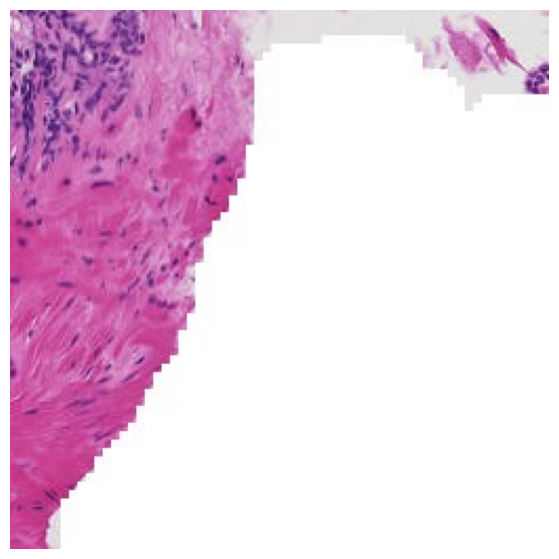

In [75]:
out = extract_and_display_cells('cells/train0_1.jpeg', cell_size=256, cell_cnt=32)

for img in out[:6]:
    plot_one_image(img)